In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
import torchvision
from torch.utils.tensorboard import SummaryWriter

/home/fcm/miniconda3/envs/iaaa/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
I =torch.eye(10).cuda()

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Hyperparameters
latent_size = 100
num_classes = 10
image_size = 32
num_epochs = 700
batch_size = 128
learning_rate = 0.002

# Dataset transformation
transform = transforms.Compose([
    transforms.Resize(image_size),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

In [4]:

m = nn.ConvTranspose2d(110, 256, 4, 1, 0, bias=False)

In [5]:
x = torch.randn((batch_size, 110, 1, 1))
out = m(x)
print(out.shape)

torch.Size([128, 256, 4, 4])


In [6]:
# CIFAR-10 dataset
train_dataset = torchvision.datasets.CIFAR10(root="./data", train=True, transform=transform, download=True)
train_loader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True, num_workers=5)

Files already downloaded and verified


In [7]:
class Generator(nn.Module):
    def __init__(self, latent_size, num_classes, image_size):
        super(Generator, self).__init__()
        self.latent_size = latent_size
        self.num_classes = num_classes
        self.image_size = image_size
        
        self.generator = nn.Sequential(
            nn.ConvTranspose2d(latent_size + num_classes, 256, 4, 1, 0, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(256, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(128, 64, 4, 2, 1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(64, 3, 4, 2, 1, bias=False),
            nn.Tanh()
        )
        
    def forward(self, noise, labels):
        gen_input = torch.cat((noise, labels), 1).view(-1, self.latent_size + self.num_classes, 1, 1)
        output = self.generator(gen_input)
        return output


In [8]:
class Discriminator(nn.Module):
    def __init__(self, num_classes, image_size):
        super(Discriminator, self).__init__()
        self.num_classes = num_classes
        self.image_size = image_size
        
        self.discriminator = nn.Sequential(
            nn.Conv2d(3, 64, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.5),
            
            nn.Conv2d(64, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.5),
            
            nn.Conv2d(128, 256, 4, 2, 1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.5),
            
            nn.Conv2d(256, num_classes + 1, 4, 1, 0, bias=False)
        )
        
    def forward(self, input):
        output = self.discriminator(input)
        return output.view(-1, self.num_classes + 1)




In [9]:
generator = Generator(latent_size, num_classes, image_size).to(device)
discriminator = Discriminator(num_classes, image_size).to(device)

# noise = torch.randn(batch_size, latent_size).to(device)
# fake_labels = torch.randint(0, num_classes, (batch_size,1)).to(device)
# writer = SummaryWriter("runs/generator")
# writer.add_graph(generator, (noise, I[fake_labels.flatten()]))
# writer.close()

# dummy_input = torch.randn((batch_size, 3, 32, 32)).to(device)

# writer = SummaryWriter("runs/discriminator")
# writer.add_graph(discriminator, dummy_input)
# writer.close()

In [10]:
adversarial_loss = nn.BCEWithLogitsLoss()
auxiliary_loss = nn.CrossEntropyLoss()


# Optimizers
optimizer_G = optim.Adam(generator.parameters(), lr=learning_rate, betas=(0.5, 0.999), )
optimizer_D = optim.Adam(discriminator.parameters(), lr=learning_rate, betas=(0.5, 0.999))

# optimizer_G = optim.SGD(generator.parameters(), lr=learning_rate, weight_decay=1e-6)
# optimizer_D = optim.SGD(discriminator.parameters(), lr=learning_rate, weight_decay=1e-6)

In [11]:
for epoch in range(num_epochs):
    for i, (images, labels) in enumerate(train_loader):
        batch_size = images.size(0)
        images = images.to(device)
        labels = labels.to(device)

        # Adversarial ground truth
        real_label = torch.ones(batch_size, 1).to(device)
        fake_label = torch.zeros(batch_size, 1).to(device)
        
        # === Train the discriminator === #
        optimizer_D.zero_grad()

        # Real images
        real_output = discriminator(images)
#         print(real_output)
        # print(real_output.shape)
        # print(real_label.shape)
        # d_real_loss = adversarial_loss(real_output[:, -1], real_label)
        d_real_loss = adversarial_loss(real_output[:, -1].flatten(), real_label.flatten())

        d_real_aux_loss = auxiliary_loss(real_output[:, :-1], labels)
        d_real_loss_total = d_real_loss + d_real_aux_loss

        # Fake images
        noise = torch.randn(batch_size, latent_size).to(device)
        fake_labels = torch.randint(0, num_classes, (batch_size,1)).to(device)
        fake_images = generator(noise, I[fake_labels.flatten()])
        fake_output = discriminator(fake_images.detach())
        d_fake_loss = adversarial_loss(fake_output[:, -1].flatten(), fake_label.flatten())
        d_fake_aux_loss = auxiliary_loss(fake_output[:, :-1], fake_labels.flatten())
        d_fake_loss_total = d_fake_loss + d_fake_aux_loss

        # Total discriminator loss
        d_loss = d_real_loss_total + d_fake_loss_total
        d_loss.backward()
        optimizer_D.step()

        # === Train the generator === #
        optimizer_G.zero_grad()
        
        noise = torch.randn(batch_size, latent_size).to(device)
        fake_labels = torch.randint(0, num_classes, (batch_size,1)).to(device)
        
        fake_images = generator(noise, I[fake_labels.flatten()])
        fake_output = discriminator(fake_images)

        g_loss = adversarial_loss(fake_output[:, -1].flatten(), real_label.flatten())
        g_aux_loss = auxiliary_loss(fake_output[:, :-1], fake_labels.flatten())
        g_loss_total = g_loss + g_aux_loss

        g_loss_total.backward()
        optimizer_G.step()

        # Print training progress
        if (i+1) % 100 == 0:
            print(f"Epoch [{epoch+1}/{num_epochs}], Step [{i+1}/{len(train_loader)}], "
                  f"Discriminator Loss: {d_loss.item():.4f}, Generator Loss: {g_loss_total.item():.4f}")



Epoch [1/700], Step [100/391], Discriminator Loss: 3.5515, Generator Loss: 2.7436
Epoch [1/700], Step [200/391], Discriminator Loss: 3.5104, Generator Loss: 2.2907
Epoch [1/700], Step [300/391], Discriminator Loss: 3.1090, Generator Loss: 2.1591
Epoch [2/700], Step [100/391], Discriminator Loss: 2.9299, Generator Loss: 1.7987
Epoch [2/700], Step [200/391], Discriminator Loss: 2.9939, Generator Loss: 1.9607
Epoch [2/700], Step [300/391], Discriminator Loss: 2.5609, Generator Loss: 2.5693
Epoch [3/700], Step [100/391], Discriminator Loss: 2.6093, Generator Loss: 2.1590
Epoch [3/700], Step [200/391], Discriminator Loss: 2.7795, Generator Loss: 1.5502
Epoch [3/700], Step [300/391], Discriminator Loss: 2.6281, Generator Loss: 1.7414
Epoch [4/700], Step [100/391], Discriminator Loss: 2.8576, Generator Loss: 1.4783
Epoch [4/700], Step [200/391], Discriminator Loss: 2.6626, Generator Loss: 1.3632
Epoch [4/700], Step [300/391], Discriminator Loss: 2.8669, Generator Loss: 1.4777
Epoch [5/700], S

Epoch [34/700], Step [200/391], Discriminator Loss: 2.3534, Generator Loss: 0.8039
Epoch [34/700], Step [300/391], Discriminator Loss: 2.2391, Generator Loss: 0.8662
Epoch [35/700], Step [100/391], Discriminator Loss: 2.2647, Generator Loss: 0.9465
Epoch [35/700], Step [200/391], Discriminator Loss: 2.3119, Generator Loss: 0.8575
Epoch [35/700], Step [300/391], Discriminator Loss: 2.5198, Generator Loss: 0.8515
Epoch [36/700], Step [100/391], Discriminator Loss: 2.1534, Generator Loss: 0.8446
Epoch [36/700], Step [200/391], Discriminator Loss: 2.2022, Generator Loss: 0.9636
Epoch [36/700], Step [300/391], Discriminator Loss: 2.1899, Generator Loss: 0.9155
Epoch [37/700], Step [100/391], Discriminator Loss: 2.2179, Generator Loss: 0.9570
Epoch [37/700], Step [200/391], Discriminator Loss: 2.4519, Generator Loss: 0.9444
Epoch [37/700], Step [300/391], Discriminator Loss: 2.2320, Generator Loss: 0.8811
Epoch [38/700], Step [100/391], Discriminator Loss: 2.0567, Generator Loss: 0.9457
Epoc

Epoch [67/700], Step [200/391], Discriminator Loss: 2.0065, Generator Loss: 0.9776
Epoch [67/700], Step [300/391], Discriminator Loss: 2.1137, Generator Loss: 0.9440
Epoch [68/700], Step [100/391], Discriminator Loss: 1.9512, Generator Loss: 0.8624
Epoch [68/700], Step [200/391], Discriminator Loss: 2.3040, Generator Loss: 0.9659
Epoch [68/700], Step [300/391], Discriminator Loss: 1.9330, Generator Loss: 0.9886
Epoch [69/700], Step [100/391], Discriminator Loss: 2.4077, Generator Loss: 0.8858
Epoch [69/700], Step [200/391], Discriminator Loss: 2.1446, Generator Loss: 1.0366
Epoch [69/700], Step [300/391], Discriminator Loss: 1.9844, Generator Loss: 0.9134
Epoch [70/700], Step [100/391], Discriminator Loss: 2.0999, Generator Loss: 0.9149
Epoch [70/700], Step [200/391], Discriminator Loss: 2.0800, Generator Loss: 0.8910
Epoch [70/700], Step [300/391], Discriminator Loss: 2.0441, Generator Loss: 0.8765
Epoch [71/700], Step [100/391], Discriminator Loss: 2.1801, Generator Loss: 0.9531
Epoc

Epoch [100/700], Step [200/391], Discriminator Loss: 2.2397, Generator Loss: 0.8441
Epoch [100/700], Step [300/391], Discriminator Loss: 2.1865, Generator Loss: 0.8546
Epoch [101/700], Step [100/391], Discriminator Loss: 2.0301, Generator Loss: 0.8763
Epoch [101/700], Step [200/391], Discriminator Loss: 2.3579, Generator Loss: 0.8599
Epoch [101/700], Step [300/391], Discriminator Loss: 2.2639, Generator Loss: 0.8995
Epoch [102/700], Step [100/391], Discriminator Loss: 2.2318, Generator Loss: 0.9826
Epoch [102/700], Step [200/391], Discriminator Loss: 1.9519, Generator Loss: 0.8620
Epoch [102/700], Step [300/391], Discriminator Loss: 2.2336, Generator Loss: 0.9375
Epoch [103/700], Step [100/391], Discriminator Loss: 2.1470, Generator Loss: 1.0836
Epoch [103/700], Step [200/391], Discriminator Loss: 2.0836, Generator Loss: 0.8292
Epoch [103/700], Step [300/391], Discriminator Loss: 1.9768, Generator Loss: 0.8191
Epoch [104/700], Step [100/391], Discriminator Loss: 2.1627, Generator Loss:

Epoch [133/700], Step [100/391], Discriminator Loss: 1.9110, Generator Loss: 0.9674
Epoch [133/700], Step [200/391], Discriminator Loss: 2.1031, Generator Loss: 0.9020
Epoch [133/700], Step [300/391], Discriminator Loss: 2.1177, Generator Loss: 0.8402
Epoch [134/700], Step [100/391], Discriminator Loss: 1.9930, Generator Loss: 0.8139
Epoch [134/700], Step [200/391], Discriminator Loss: 2.2068, Generator Loss: 0.8377
Epoch [134/700], Step [300/391], Discriminator Loss: 2.0544, Generator Loss: 0.9102
Epoch [135/700], Step [100/391], Discriminator Loss: 1.9555, Generator Loss: 0.8476
Epoch [135/700], Step [200/391], Discriminator Loss: 2.1022, Generator Loss: 0.8732
Epoch [135/700], Step [300/391], Discriminator Loss: 1.9326, Generator Loss: 0.9307
Epoch [136/700], Step [100/391], Discriminator Loss: 2.1578, Generator Loss: 0.9185
Epoch [136/700], Step [200/391], Discriminator Loss: 2.1507, Generator Loss: 0.8650
Epoch [136/700], Step [300/391], Discriminator Loss: 2.0469, Generator Loss:

Epoch [165/700], Step [300/391], Discriminator Loss: 2.2037, Generator Loss: 1.0336
Epoch [166/700], Step [100/391], Discriminator Loss: 2.3279, Generator Loss: 1.0802
Epoch [166/700], Step [200/391], Discriminator Loss: 2.1352, Generator Loss: 0.9249
Epoch [166/700], Step [300/391], Discriminator Loss: 1.9613, Generator Loss: 0.8987
Epoch [167/700], Step [100/391], Discriminator Loss: 2.0381, Generator Loss: 1.0629
Epoch [167/700], Step [200/391], Discriminator Loss: 1.9998, Generator Loss: 0.7975
Epoch [167/700], Step [300/391], Discriminator Loss: 2.2471, Generator Loss: 0.8370
Epoch [168/700], Step [100/391], Discriminator Loss: 2.1711, Generator Loss: 0.7932
Epoch [168/700], Step [200/391], Discriminator Loss: 2.0423, Generator Loss: 0.9363
Epoch [168/700], Step [300/391], Discriminator Loss: 2.0427, Generator Loss: 0.8518
Epoch [169/700], Step [100/391], Discriminator Loss: 2.1361, Generator Loss: 0.9724
Epoch [169/700], Step [200/391], Discriminator Loss: 2.1744, Generator Loss:

Epoch [198/700], Step [200/391], Discriminator Loss: 2.0244, Generator Loss: 0.7677
Epoch [198/700], Step [300/391], Discriminator Loss: 2.2286, Generator Loss: 0.8839
Epoch [199/700], Step [100/391], Discriminator Loss: 2.1119, Generator Loss: 0.9256
Epoch [199/700], Step [200/391], Discriminator Loss: 1.9195, Generator Loss: 0.8289
Epoch [199/700], Step [300/391], Discriminator Loss: 1.7589, Generator Loss: 0.8980
Epoch [200/700], Step [100/391], Discriminator Loss: 1.9668, Generator Loss: 0.9862
Epoch [200/700], Step [200/391], Discriminator Loss: 2.0215, Generator Loss: 0.8822
Epoch [200/700], Step [300/391], Discriminator Loss: 2.1866, Generator Loss: 1.0632
Epoch [201/700], Step [100/391], Discriminator Loss: 2.2810, Generator Loss: 0.8544
Epoch [201/700], Step [200/391], Discriminator Loss: 2.0667, Generator Loss: 0.9692
Epoch [201/700], Step [300/391], Discriminator Loss: 2.0269, Generator Loss: 0.9125
Epoch [202/700], Step [100/391], Discriminator Loss: 2.2004, Generator Loss:

Epoch [231/700], Step [100/391], Discriminator Loss: 1.9859, Generator Loss: 0.9967
Epoch [231/700], Step [200/391], Discriminator Loss: 2.0628, Generator Loss: 0.8016
Epoch [231/700], Step [300/391], Discriminator Loss: 2.3191, Generator Loss: 0.9064
Epoch [232/700], Step [100/391], Discriminator Loss: 2.0376, Generator Loss: 0.8701
Epoch [232/700], Step [200/391], Discriminator Loss: 2.1173, Generator Loss: 0.9354
Epoch [232/700], Step [300/391], Discriminator Loss: 1.9467, Generator Loss: 0.8409
Epoch [233/700], Step [100/391], Discriminator Loss: 1.9875, Generator Loss: 0.9834
Epoch [233/700], Step [200/391], Discriminator Loss: 2.2284, Generator Loss: 1.0127
Epoch [233/700], Step [300/391], Discriminator Loss: 2.0452, Generator Loss: 1.0689
Epoch [234/700], Step [100/391], Discriminator Loss: 2.1506, Generator Loss: 0.8935
Epoch [234/700], Step [200/391], Discriminator Loss: 2.1257, Generator Loss: 1.2174
Epoch [234/700], Step [300/391], Discriminator Loss: 2.0337, Generator Loss:

Epoch [263/700], Step [300/391], Discriminator Loss: 2.2361, Generator Loss: 1.0888
Epoch [264/700], Step [100/391], Discriminator Loss: 2.2929, Generator Loss: 0.9504
Epoch [264/700], Step [200/391], Discriminator Loss: 1.9354, Generator Loss: 0.9294
Epoch [264/700], Step [300/391], Discriminator Loss: 2.2077, Generator Loss: 0.9480
Epoch [265/700], Step [100/391], Discriminator Loss: 2.0559, Generator Loss: 0.8688
Epoch [265/700], Step [200/391], Discriminator Loss: 2.0621, Generator Loss: 0.7609
Epoch [265/700], Step [300/391], Discriminator Loss: 2.0474, Generator Loss: 1.0053
Epoch [266/700], Step [100/391], Discriminator Loss: 1.9283, Generator Loss: 1.1520
Epoch [266/700], Step [200/391], Discriminator Loss: 1.7690, Generator Loss: 0.9429
Epoch [266/700], Step [300/391], Discriminator Loss: 2.0562, Generator Loss: 0.7966
Epoch [267/700], Step [100/391], Discriminator Loss: 1.8803, Generator Loss: 0.8801
Epoch [267/700], Step [200/391], Discriminator Loss: 1.7591, Generator Loss:

Epoch [296/700], Step [200/391], Discriminator Loss: 1.9309, Generator Loss: 0.9518
Epoch [296/700], Step [300/391], Discriminator Loss: 1.8432, Generator Loss: 1.0250
Epoch [297/700], Step [100/391], Discriminator Loss: 2.1185, Generator Loss: 0.8790
Epoch [297/700], Step [200/391], Discriminator Loss: 1.9615, Generator Loss: 0.8088
Epoch [297/700], Step [300/391], Discriminator Loss: 2.0840, Generator Loss: 0.9257
Epoch [298/700], Step [100/391], Discriminator Loss: 2.1219, Generator Loss: 0.8850
Epoch [298/700], Step [200/391], Discriminator Loss: 1.8728, Generator Loss: 1.0540
Epoch [298/700], Step [300/391], Discriminator Loss: 2.3018, Generator Loss: 1.0981
Epoch [299/700], Step [100/391], Discriminator Loss: 2.2029, Generator Loss: 0.8241
Epoch [299/700], Step [200/391], Discriminator Loss: 2.2110, Generator Loss: 1.1834
Epoch [299/700], Step [300/391], Discriminator Loss: 1.9957, Generator Loss: 1.2192
Epoch [300/700], Step [100/391], Discriminator Loss: 1.9199, Generator Loss:

Epoch [329/700], Step [100/391], Discriminator Loss: 1.8899, Generator Loss: 1.1334
Epoch [329/700], Step [200/391], Discriminator Loss: 2.1821, Generator Loss: 0.7949
Epoch [329/700], Step [300/391], Discriminator Loss: 2.0071, Generator Loss: 1.0723
Epoch [330/700], Step [100/391], Discriminator Loss: 2.1677, Generator Loss: 0.8378
Epoch [330/700], Step [200/391], Discriminator Loss: 2.0179, Generator Loss: 0.9534
Epoch [330/700], Step [300/391], Discriminator Loss: 1.9665, Generator Loss: 1.1622
Epoch [331/700], Step [100/391], Discriminator Loss: 1.6408, Generator Loss: 0.8802
Epoch [331/700], Step [200/391], Discriminator Loss: 1.9171, Generator Loss: 1.1199
Epoch [331/700], Step [300/391], Discriminator Loss: 1.9423, Generator Loss: 1.1840
Epoch [332/700], Step [100/391], Discriminator Loss: 1.8585, Generator Loss: 0.8234
Epoch [332/700], Step [200/391], Discriminator Loss: 2.0629, Generator Loss: 0.9302
Epoch [332/700], Step [300/391], Discriminator Loss: 1.8919, Generator Loss:

Epoch [361/700], Step [300/391], Discriminator Loss: 1.6379, Generator Loss: 0.9618
Epoch [362/700], Step [100/391], Discriminator Loss: 1.8882, Generator Loss: 1.3603
Epoch [362/700], Step [200/391], Discriminator Loss: 2.2618, Generator Loss: 1.0204
Epoch [362/700], Step [300/391], Discriminator Loss: 2.2666, Generator Loss: 1.1336
Epoch [363/700], Step [100/391], Discriminator Loss: 2.0099, Generator Loss: 1.3173
Epoch [363/700], Step [200/391], Discriminator Loss: 1.9395, Generator Loss: 1.3906
Epoch [363/700], Step [300/391], Discriminator Loss: 1.8400, Generator Loss: 1.2001
Epoch [364/700], Step [100/391], Discriminator Loss: 2.2667, Generator Loss: 0.8366
Epoch [364/700], Step [200/391], Discriminator Loss: 1.7441, Generator Loss: 0.8720
Epoch [364/700], Step [300/391], Discriminator Loss: 2.0359, Generator Loss: 1.3781
Epoch [365/700], Step [100/391], Discriminator Loss: 1.6918, Generator Loss: 1.6150
Epoch [365/700], Step [200/391], Discriminator Loss: 2.2127, Generator Loss:

Epoch [394/700], Step [200/391], Discriminator Loss: 1.5529, Generator Loss: 0.9376
Epoch [394/700], Step [300/391], Discriminator Loss: 2.0945, Generator Loss: 1.0924
Epoch [395/700], Step [100/391], Discriminator Loss: 1.7563, Generator Loss: 1.1508
Epoch [395/700], Step [200/391], Discriminator Loss: 1.9088, Generator Loss: 1.0951
Epoch [395/700], Step [300/391], Discriminator Loss: 1.4762, Generator Loss: 1.2524
Epoch [396/700], Step [100/391], Discriminator Loss: 1.7690, Generator Loss: 1.2296
Epoch [396/700], Step [200/391], Discriminator Loss: 1.9367, Generator Loss: 1.0181
Epoch [396/700], Step [300/391], Discriminator Loss: 2.0194, Generator Loss: 0.8217
Epoch [397/700], Step [100/391], Discriminator Loss: 2.1503, Generator Loss: 1.1845
Epoch [397/700], Step [200/391], Discriminator Loss: 2.1825, Generator Loss: 1.5779
Epoch [397/700], Step [300/391], Discriminator Loss: 2.2268, Generator Loss: 1.9492
Epoch [398/700], Step [100/391], Discriminator Loss: 1.9288, Generator Loss:

Epoch [427/700], Step [100/391], Discriminator Loss: 1.7325, Generator Loss: 0.8849
Epoch [427/700], Step [200/391], Discriminator Loss: 2.2561, Generator Loss: 1.0671
Epoch [427/700], Step [300/391], Discriminator Loss: 2.1761, Generator Loss: 1.5539
Epoch [428/700], Step [100/391], Discriminator Loss: 2.1425, Generator Loss: 0.7201
Epoch [428/700], Step [200/391], Discriminator Loss: 1.8167, Generator Loss: 1.9696
Epoch [428/700], Step [300/391], Discriminator Loss: 1.7616, Generator Loss: 1.2013
Epoch [429/700], Step [100/391], Discriminator Loss: 2.1873, Generator Loss: 1.3055
Epoch [429/700], Step [200/391], Discriminator Loss: 1.6376, Generator Loss: 1.1181
Epoch [429/700], Step [300/391], Discriminator Loss: 1.8053, Generator Loss: 1.3328
Epoch [430/700], Step [100/391], Discriminator Loss: 2.2405, Generator Loss: 1.5984
Epoch [430/700], Step [200/391], Discriminator Loss: 2.1135, Generator Loss: 1.8015
Epoch [430/700], Step [300/391], Discriminator Loss: 2.0889, Generator Loss:

Epoch [459/700], Step [300/391], Discriminator Loss: 1.8838, Generator Loss: 1.0694
Epoch [460/700], Step [100/391], Discriminator Loss: 2.1607, Generator Loss: 1.5336
Epoch [460/700], Step [200/391], Discriminator Loss: 1.8070, Generator Loss: 1.7499
Epoch [460/700], Step [300/391], Discriminator Loss: 1.8604, Generator Loss: 0.8876
Epoch [461/700], Step [100/391], Discriminator Loss: 1.8884, Generator Loss: 1.3259
Epoch [461/700], Step [200/391], Discriminator Loss: 2.0631, Generator Loss: 1.2455
Epoch [461/700], Step [300/391], Discriminator Loss: 1.9397, Generator Loss: 1.0522
Epoch [462/700], Step [100/391], Discriminator Loss: 2.4348, Generator Loss: 0.9062
Epoch [462/700], Step [200/391], Discriminator Loss: 2.0210, Generator Loss: 1.9335
Epoch [462/700], Step [300/391], Discriminator Loss: 1.8391, Generator Loss: 1.3618
Epoch [463/700], Step [100/391], Discriminator Loss: 2.1447, Generator Loss: 1.0793
Epoch [463/700], Step [200/391], Discriminator Loss: 1.6309, Generator Loss:

Epoch [492/700], Step [200/391], Discriminator Loss: 1.5556, Generator Loss: 1.6210
Epoch [492/700], Step [300/391], Discriminator Loss: 1.4994, Generator Loss: 1.1962
Epoch [493/700], Step [100/391], Discriminator Loss: 1.5922, Generator Loss: 0.6956
Epoch [493/700], Step [200/391], Discriminator Loss: 2.1897, Generator Loss: 0.9852
Epoch [493/700], Step [300/391], Discriminator Loss: 2.1011, Generator Loss: 0.9740
Epoch [494/700], Step [100/391], Discriminator Loss: 2.2779, Generator Loss: 1.3449
Epoch [494/700], Step [200/391], Discriminator Loss: 1.8500, Generator Loss: 1.9151
Epoch [494/700], Step [300/391], Discriminator Loss: 2.1571, Generator Loss: 1.2550
Epoch [495/700], Step [100/391], Discriminator Loss: 1.7992, Generator Loss: 1.1249
Epoch [495/700], Step [200/391], Discriminator Loss: 1.8500, Generator Loss: 1.0555
Epoch [495/700], Step [300/391], Discriminator Loss: 1.8922, Generator Loss: 0.5496
Epoch [496/700], Step [100/391], Discriminator Loss: 2.4287, Generator Loss:

Epoch [525/700], Step [100/391], Discriminator Loss: 1.9226, Generator Loss: 1.3132
Epoch [525/700], Step [200/391], Discriminator Loss: 2.2730, Generator Loss: 0.9543
Epoch [525/700], Step [300/391], Discriminator Loss: 1.5958, Generator Loss: 2.0669
Epoch [526/700], Step [100/391], Discriminator Loss: 2.2176, Generator Loss: 0.8312
Epoch [526/700], Step [200/391], Discriminator Loss: 1.8483, Generator Loss: 1.7160
Epoch [526/700], Step [300/391], Discriminator Loss: 2.1053, Generator Loss: 0.6620
Epoch [527/700], Step [100/391], Discriminator Loss: 1.9042, Generator Loss: 1.6672
Epoch [527/700], Step [200/391], Discriminator Loss: 2.0724, Generator Loss: 1.7087
Epoch [527/700], Step [300/391], Discriminator Loss: 2.1858, Generator Loss: 1.5356
Epoch [528/700], Step [100/391], Discriminator Loss: 1.4384, Generator Loss: 1.1346
Epoch [528/700], Step [200/391], Discriminator Loss: 1.6587, Generator Loss: 1.6345
Epoch [528/700], Step [300/391], Discriminator Loss: 1.7213, Generator Loss:

Epoch [557/700], Step [300/391], Discriminator Loss: 1.6896, Generator Loss: 1.5210
Epoch [558/700], Step [100/391], Discriminator Loss: 2.0852, Generator Loss: 0.9960
Epoch [558/700], Step [200/391], Discriminator Loss: 2.2776, Generator Loss: 1.5461
Epoch [558/700], Step [300/391], Discriminator Loss: 1.8239, Generator Loss: 1.6392
Epoch [559/700], Step [100/391], Discriminator Loss: 2.0287, Generator Loss: 1.5430
Epoch [559/700], Step [200/391], Discriminator Loss: 2.0648, Generator Loss: 1.6755
Epoch [559/700], Step [300/391], Discriminator Loss: 2.1826, Generator Loss: 1.8118
Epoch [560/700], Step [100/391], Discriminator Loss: 2.0039, Generator Loss: 0.6695
Epoch [560/700], Step [200/391], Discriminator Loss: 2.4187, Generator Loss: 1.8284
Epoch [560/700], Step [300/391], Discriminator Loss: 1.8642, Generator Loss: 1.2664
Epoch [561/700], Step [100/391], Discriminator Loss: 2.0739, Generator Loss: 1.3080
Epoch [561/700], Step [200/391], Discriminator Loss: 2.3684, Generator Loss:

Epoch [590/700], Step [200/391], Discriminator Loss: 1.7991, Generator Loss: 1.2163
Epoch [590/700], Step [300/391], Discriminator Loss: 1.9541, Generator Loss: 1.2336
Epoch [591/700], Step [100/391], Discriminator Loss: 1.8268, Generator Loss: 1.5311
Epoch [591/700], Step [200/391], Discriminator Loss: 1.8056, Generator Loss: 1.1554
Epoch [591/700], Step [300/391], Discriminator Loss: 1.7404, Generator Loss: 0.9953
Epoch [592/700], Step [100/391], Discriminator Loss: 1.9891, Generator Loss: 1.2068
Epoch [592/700], Step [200/391], Discriminator Loss: 1.9899, Generator Loss: 2.4175
Epoch [592/700], Step [300/391], Discriminator Loss: 2.0723, Generator Loss: 2.6832
Epoch [593/700], Step [100/391], Discriminator Loss: 1.7308, Generator Loss: 1.3704
Epoch [593/700], Step [200/391], Discriminator Loss: 2.1765, Generator Loss: 1.7252
Epoch [593/700], Step [300/391], Discriminator Loss: 2.9262, Generator Loss: 1.1095
Epoch [594/700], Step [100/391], Discriminator Loss: 1.5053, Generator Loss:

Epoch [623/700], Step [100/391], Discriminator Loss: 3.0217, Generator Loss: 0.5519
Epoch [623/700], Step [200/391], Discriminator Loss: 1.8071, Generator Loss: 1.8029
Epoch [623/700], Step [300/391], Discriminator Loss: 1.7419, Generator Loss: 1.7936
Epoch [624/700], Step [100/391], Discriminator Loss: 2.0569, Generator Loss: 0.9921
Epoch [624/700], Step [200/391], Discriminator Loss: 1.4231, Generator Loss: 2.2743
Epoch [624/700], Step [300/391], Discriminator Loss: 1.8384, Generator Loss: 1.2950
Epoch [625/700], Step [100/391], Discriminator Loss: 1.4013, Generator Loss: 1.6108
Epoch [625/700], Step [200/391], Discriminator Loss: 1.9472, Generator Loss: 1.6178
Epoch [625/700], Step [300/391], Discriminator Loss: 1.5560, Generator Loss: 1.5540
Epoch [626/700], Step [100/391], Discriminator Loss: 1.6398, Generator Loss: 2.1793
Epoch [626/700], Step [200/391], Discriminator Loss: 1.2096, Generator Loss: 1.0872
Epoch [626/700], Step [300/391], Discriminator Loss: 2.3488, Generator Loss:

Epoch [655/700], Step [300/391], Discriminator Loss: 2.3436, Generator Loss: 1.5903
Epoch [656/700], Step [100/391], Discriminator Loss: 1.3497, Generator Loss: 0.6924
Epoch [656/700], Step [200/391], Discriminator Loss: 2.0856, Generator Loss: 1.8273
Epoch [656/700], Step [300/391], Discriminator Loss: 2.3597, Generator Loss: 1.3114
Epoch [657/700], Step [100/391], Discriminator Loss: 1.4114, Generator Loss: 0.8581
Epoch [657/700], Step [200/391], Discriminator Loss: 1.9917, Generator Loss: 2.5364
Epoch [657/700], Step [300/391], Discriminator Loss: 1.7848, Generator Loss: 1.5705
Epoch [658/700], Step [100/391], Discriminator Loss: 2.1579, Generator Loss: 3.1272
Epoch [658/700], Step [200/391], Discriminator Loss: 1.5889, Generator Loss: 0.9196
Epoch [658/700], Step [300/391], Discriminator Loss: 1.9411, Generator Loss: 1.5806
Epoch [659/700], Step [100/391], Discriminator Loss: 1.7796, Generator Loss: 2.4937
Epoch [659/700], Step [200/391], Discriminator Loss: 2.2365, Generator Loss:

Epoch [688/700], Step [200/391], Discriminator Loss: 1.6171, Generator Loss: 1.1472
Epoch [688/700], Step [300/391], Discriminator Loss: 1.8162, Generator Loss: 0.9491
Epoch [689/700], Step [100/391], Discriminator Loss: 1.9714, Generator Loss: 1.2416
Epoch [689/700], Step [200/391], Discriminator Loss: 1.7142, Generator Loss: 1.5915
Epoch [689/700], Step [300/391], Discriminator Loss: 1.6660, Generator Loss: 1.6762
Epoch [690/700], Step [100/391], Discriminator Loss: 1.6839, Generator Loss: 1.0087
Epoch [690/700], Step [200/391], Discriminator Loss: 1.9043, Generator Loss: 1.1428
Epoch [690/700], Step [300/391], Discriminator Loss: 2.1295, Generator Loss: 1.9839
Epoch [691/700], Step [100/391], Discriminator Loss: 1.5637, Generator Loss: 1.4580
Epoch [691/700], Step [200/391], Discriminator Loss: 1.7180, Generator Loss: 1.6068
Epoch [691/700], Step [300/391], Discriminator Loss: 1.8025, Generator Loss: 1.1627
Epoch [692/700], Step [100/391], Discriminator Loss: 1.5289, Generator Loss:

In [44]:
# torch.cat((noise, fake_labels), 1).view(-1,101,1,1).shape

torch.Size([100, 101, 1, 1])

In [12]:
from matplotlib import pyplot as plt

In [13]:
class_str = ["airplane" ,
"automobile",
"bird" ,
"cat" ,
"deer" ,
"dog" ,
"frog" ,
"horse" ,
"ship" ,
"truck"]


In [14]:
# for i in range(len(fake_labels)):
#     plt.imshow(((fake_images[i].permute(1,2,0).detach().cpu().numpy()+1)/2),interpolation = 'bilinear')
#     plt.title(class_str[fake_labels[i]])
#     plt.show()

In [15]:
noise = torch.randn(batch_size, latent_size).to(device)
fake_labels = torch.randint(0, num_classes, (batch_size,1)).to(device)
# fake_labels = 5*torch.ones((batch_size,1)).to(device).long()

fake_images = generator(noise, I[fake_labels.flatten()])

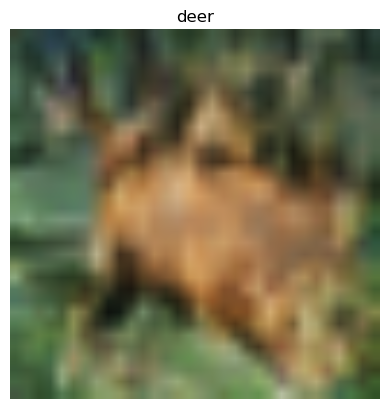

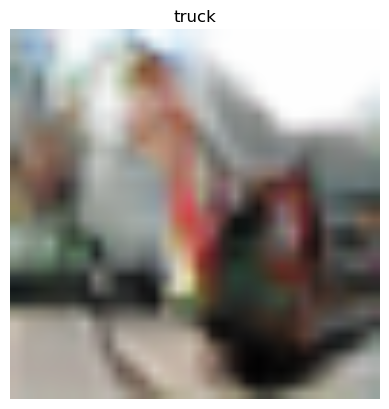

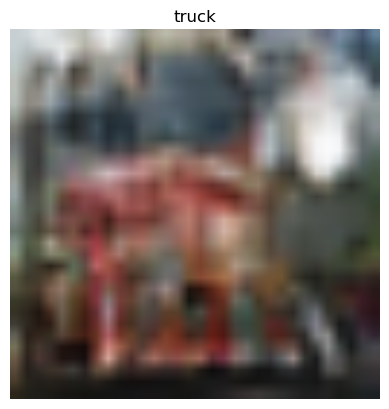

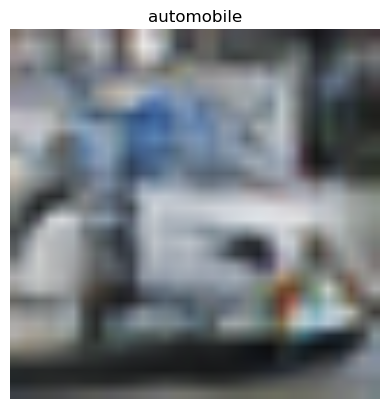

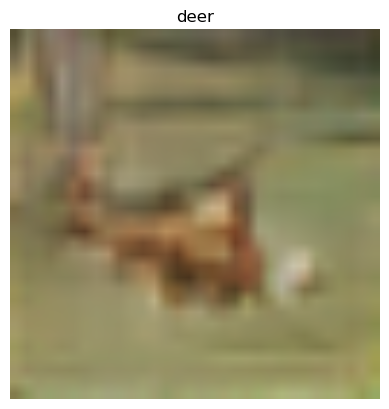

...

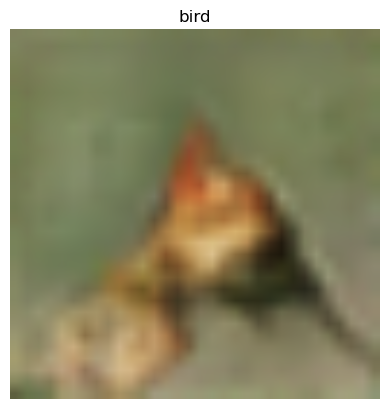

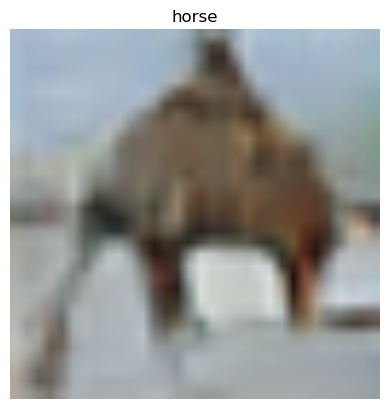

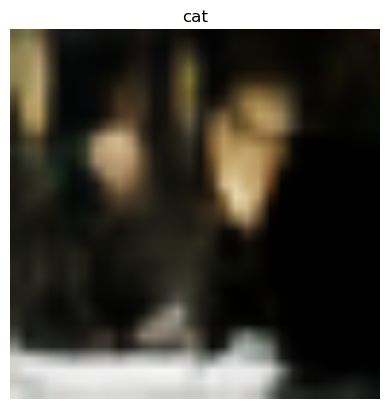

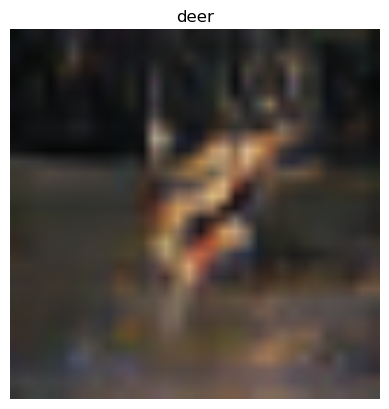

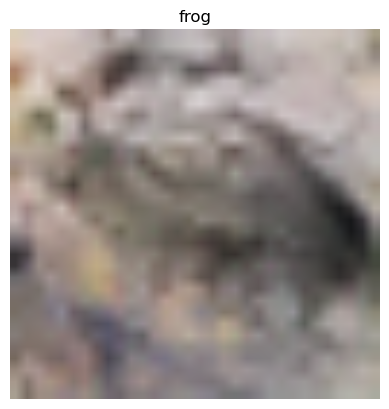

In [16]:
for i in range(len(fake_labels)):
    plt.imshow(((fake_images[i].permute(1,2,0).detach().cpu().numpy()+1)/2),interpolation = 'bilinear')
    plt.title(class_str[fake_labels[i]])
    plt.axis('off')
    plt.show()
    

In [42]:
torch.save(generator.state_dict(), "generator1000.pt")
torch.save(discriminator.state_dict(), "discriminator1000.pt")

In [ ]:
torch.save